# Comparison of Nanocompore / Tombo / Epinano

### Imports

In [1]:
# Standard lib imports
import os
from datetime import date
from collections import *
from glob import glob, iglob
from shutil import rmtree
import itertools
from pprint import pprint as pp
from math import *

# Generic third party imports
from pycltools.pycltools import *
import pysam
import pyfaidx
from tqdm import tqdm

# Ploting lib imports
import matplotlib.pyplot as pl
import seaborn as sns
import matplotlib_venn as mv
import upsetplot as usp
import networkx as nx
%matplotlib inline

# Data wrangling lib imports
import numpy as np
import scipy as sp
from scipy.signal import find_peaks
import pandas as pd
pd.options.display.max_rows = 500
pd.options.display.min_rows = 50
pd.options.display.max_colwidth = 500

### List src datasets

In [2]:
l = [
    ["KD_1", "/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180522_1533_69/fast5", "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_1/guppy"],
    ["KD_2", "/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_KD_2/fast5", "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_2/guppy"],
    ["WT_1", "/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180523_1703_CT_2/fast5", "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_1/guppy"],
    ["WT_2", "/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_WT_2/fast5", "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_2/guppy"]]

df = pd.DataFrame(l, columns=["sample_id", "fast5_dir", "fastq_dir"])
df = df.set_index("sample_id")
df

,fast5_dir,fastq_dir
sample_id,,
KD_1,/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180522_1533_69/fast5,/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_1/guppy
KD_2,/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_KD_2/fast5,/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_2/guppy
WT_1,/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180523_1703_CT_2/fast5,/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_1/guppy
WT_2,/nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_WT_2/fast5,/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_2/guppy


## Tombo

### Copy fast5

In [18]:
out_dir = "fast5" 
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

for sample_id, line in df.iterrows():
    sample_out_dir = os.path.join(out_dir, sample_id)
    bsub (f"cp -r {line.fast5_dir}* {sample_out_dir}")

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/fast5
bsub  "cp -r /nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180522_1533_69/* fast5/KD_1"
Job <5983807> is submitted to default queue <standard>.
bsub  "cp -r /nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_KD_2/* fast5/KD_2"
Job <5983808> is submitted to default queue <standard>.
bsub  "cp -r /nfs/leia/research/enright/nanopore/datasets/RNA_RUN_04_METTL3_KD/20180523_1703_CT_2/* fast5/WT_1"
Job <5983809> is submitted to default queue <standard>.
bsub  "cp -r /nfs/leia/research/enright/nanopore/datasets/RNA_RUN_06_METTL3_KD_2/20181206_1707_WT_2/* fast5/WT_2"
Job <5983810> is submitted to default queue <standard>.


### Copy and merge fastq

In [29]:
out_dir = "fastq" 
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

for sample_id, line in df.iterrows():
    sample_out = os.path.join(out_dir, f"{sample_id}.fastq")
    bsub(f"pyBioTools Fastq Filter --remove_duplicates -i {line.fastq_dir} -o {sample_out}",
         virtualenv="Python3.6")

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/fastq
bsub  "pyBioTools Fastq Filter --remove_duplicates -i /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_1/guppy -o fastq/KD_1.fastq"
Job <5984458> is submitted to default queue <standard>.


/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
virtualenvwrapper.sh: There was a problem running the initialization hooks.

If Python could not import the module virtualenvwrapper.hook_loader,
check that virtualenvwrapper has been installed for
VIRTUALENVWRAPPER_PYTHON=/nfs/software/birney/miniconda3/bin/python and that PATH is
set properly.
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'vir

bsub  "pyBioTools Fastq Filter --remove_duplicates -i /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/KD_2/guppy -o fastq/KD_2.fastq"
Job <5984487> is submitted to default queue <standard>.


/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
virtualenvwrapper.sh: There was a problem running the initialization hooks.

If Python could not import the module virtualenvwrapper.hook_loader,
check that virtualenvwrapper has been installed for
VIRTUALENVWRAPPER_PYTHON=/nfs/software/birney/miniconda3/bin/python and that PATH is
set properly.
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'vir

bsub  "pyBioTools Fastq Filter --remove_duplicates -i /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_1/guppy -o fastq/WT_1.fastq"
Job <5984488> is submitted to default queue <standard>.
bsub  "pyBioTools Fastq Filter --remove_duplicates -i /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/WT_2/guppy -o fastq/WT_2.fastq"


/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
virtualenvwrapper.sh: There was a problem running the initialization hooks.

If Python could not import the module virtualenvwrapper.hook_loader,
check that virtualenvwrapper has been installed for
VIRTUALENVWRAPPER_PYTHON=/nfs/software/birney/miniconda3/bin/python and that PATH is
set properly.
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'vir

Job <5984489> is submitted to default queue <standard>.


/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
virtualenvwrapper.sh: There was a problem running the initialization hooks.

If Python could not import the module virtualenvwrapper.hook_loader,
check that virtualenvwrapper has been installed for
VIRTUALENVWRAPPER_PYTHON=/nfs/software/birney/miniconda3/bin/python and that PATH is
set properly.
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'virtualenvwrapper')
/nfs/software/birney/miniconda3/bin/python: Error while finding module specification for 'virtualenvwrapper.hook_loader' (ModuleNotFoundError: No module named 'vir

### Annotate_raw_with_fastqs

In [68]:
threads = 10
mem=20000

for sample_id, line in df.iterrows():
    fastq = os.path.join("fastq", f"{sample_id}.fastq")
    fast5 = sample_out_dir = os.path.join("fast5", sample_id)
    bsub (cmd=f"tombo preprocess annotate_raw_with_fastqs --fast5-basedir {fast5} --fastq-filenames {fastq} --overwrite --processes {threads}",
          conda="tombo", mem=mem, threads=threads)

bsub -M 20000 -R 'rusage[mem=20000]' -n 5  "tombo preprocess annotate_raw_with_fastqs --fast5-basedir fast5/KD_1 --fastq-filenames fastq/KD_1.fastq --overwrite --processes 10"
Job <6092592> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 5  "tombo preprocess annotate_raw_with_fastqs --fast5-basedir fast5/KD_2 --fastq-filenames fastq/KD_2.fastq --overwrite --processes 10"
Job <6092593> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 5  "tombo preprocess annotate_raw_with_fastqs --fast5-basedir fast5/WT_1 --fastq-filenames fastq/WT_1.fastq --overwrite --processes 10"
Job <6092594> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 5  "tombo preprocess annotate_raw_with_fastqs --fast5-basedir fast5/WT_2 --fastq-filenames fastq/WT_2.fastq --overwrite --processes 10"
Job <6092595> is submitted to default queue <standard>.


### Resquigle

In [94]:
ref = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
threads = 10
mem=20000

for sample_id, line in df.iterrows():
    fast5 = os.path.join("fast5", sample_id)
    bsub (cmd=f"tombo resquiggle --rna --overwrite --processes {threads} {fast5} {ref}",
          conda="tombo", mem=mem, threads=threads)# , stderr_fp=comp_out_dir+"_stderr.txt" , stdout_print=comp_out_dir+"_stdout.txt")

bsub -M 20000 -R 'rusage[mem=20000]' -n 10  "tombo resquiggle --rna --overwrite --processes 10 fast5/KD_1 /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
Job <6137267> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 10  "tombo resquiggle --rna --overwrite --processes 10 fast5/KD_2 /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
Job <6137268> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 10  "tombo resquiggle --rna --overwrite --processes 10 fast5/WT_1 /hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
Job <6137269> is submitted to default queue <standard>.
bsub -M 20000 -R 'rusage[mem=20000]' -n 10  "tombo resquiggle --rna --overwrite --processes 10 fast5/WT_2 /hps/nobackup/enright/tom/new_nan

### Compare samples

In [169]:
out_dir = "tombo_comparison" 
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

threads = 10
mem = 20000
min_reads = 50
dry=False
sample_list = (("Rep1", "fast5/KD_1", "fast5/WT_1"), ("Rep2", "fast5/KD_2", "fast5/WT_2"))

for comp_name, control_fast5, exp_fast5 in sample_list:
    print(f"Comparaison {comp_name}")
    for context in [0,1,2,3]:
        print(f"Sequence context {context}")
        comp_out_dir = os.path.join("comparison", comp_name+f"_context_{context}")
        bsub (cmd=f"tombo detect_modifications level_sample_compare --minimum-test-reads {min_reads} --fishers-method-context {context} --fast5-basedirs {exp_fast5} --alternate-fast5-basedirs {control_fast5} --statistics-file-basename {comp_out_dir} --statistic-type ks --store-p-value --processes {threads}",
              conda="tombo", mem=mem, threads=threads, stderr_fp=comp_out_dir+"_stderr.txt" , stdout_print=comp_out_dir+"_stdout.txt", dry=dry)

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/comparison
Comparaison Rep1
Sequence context 0
bsub -M 20000 -R 'rusage[mem=20000]' -n 10 -eo comparison/Rep1_context_0_stderr.txt  "tombo detect_modifications level_sample_compare --minimum-test-reads 30 --fishers-method-context 0 --fast5-basedirs fast5/WT_1 --alternate-fast5-basedirs fast5/KD_1 --statistics-file-basename comparison/Rep1_context_0 --statistic-type ks --store-p-value --processes 10"
Job <9424852> is submitted to default queue <standard>.
Sequence context 1
bsub -M 20000 -R 'rusage[mem=20000]' -n 10 -eo comparison/Rep1_context_1_stderr.txt  "tombo detect_modifications level_sample_compare --minimum-test-reads 30 --fishers-method-context 1 --fast5-basedirs fast5/WT_1 --alternate-fast5-basedirs fast5/KD_1 --statistics-file-basename comparison/Rep1_context_1 --statistic-type ks --store-p-value --processes 10"
Job <9424853> is submitted to default queue <standard>.
Sequence context 2
bsub -M 20000 -R 'r

### Tabular dump of Tombo data

In [ ]:
out_dir = "text_output_tombo" 
rmtree (out_dir, ignore_errors=True)
mkdir (out_dir)

In [5]:
sample_list = (("Rep1", "fast5/KD_1", "fast5/WT_1"), ("Rep2", "fast5/KD_2", "fast5/WT_2"))
min_cov = 50

out_dir = "text_output_tombo" 
out_fn = os.path.join(out_dir, "tombo_pvalues.tsv.gz")

# Smallest float to clip data
min_pval = np.nextafter(float(0), float(1))
max_pval = 1

all_df = pd.DataFrame()
for comp_name, control_fast5, exp_fast5 in sample_list:
    print(f"Comparison {comp_name}")
    for context in [0,1,2,3]:
        print(f"Sequence context {context}")
        in_fn = f'tombo_comparison/{comp_name}_context_{context}.tombo.stats'
        c = Counter()
        tx_df_list =[]
        with h5py.File(in_fn,'r') as h5:
            tx_id_list =[]
            for block_id, block_data in h5["Statistic_Blocks"].items():
                tx_id = block_data.attrs['chrm']
                block_df = pd.DataFrame(block_data.get("block_stats")[()])
                
                # Filter low coverage up to recommanded TOMBO value
                block_df = block_df[(block_df["cov"]>=min_cov) & (block_df["control_cov"]>=min_cov)]
                
                if tx_id in tx_id_list:
                    c["Duplicated transcript"]+=1
                elif block_df.empty:
                    c["Low coverage transcripts discarded"]+=1     
                else:
                    c["Valid transcripts"]+=1 
                    block_df["ref_id"] = tx_id
                    block_df["stat"] = np.clip(block_df["stat"], min_pval, max_pval)
                    block_df["min_cov"] = block_df[['cov','control_cov']].min(axis=1)
                    tx_id_list.append(tx_id)
                    tx_df_list.append(block_df)
        
        stdout_print(dict_to_report(c, ntab=1))
        # Concatenate results
        df = pd.concat(tx_df_list)
        df = df[["ref_id","pos", "stat", "min_cov"]]
        df=df.rename(columns={"stat":f"{comp_name}_context_{context}_pvalue", "min_cov":f"{comp_name}_context_{context}_cov"})
        
        if all_df.empty:
            all_df = df
        else:
            all_df = pd.merge(all_df, df, how="outer", on=["ref_id", "pos"])
        
all_df = all_df.sort_values(by=["ref_id", "pos"])
all_df = all_df.reset_index(drop=True)
all_df.to_csv(out_fn, sep="\t", index=False)
display(all_df.head())

Comparison Rep1
Sequence context 0
	Valid transcripts:1014
	Low coverage transcripts discarded:667
	Duplicated transcript:1
Sequence context 1
	Valid transcripts:1014
	Low coverage transcripts discarded:667
	Duplicated transcript:1
Sequence context 2
	Valid transcripts:1014
	Low coverage transcripts discarded:667
	Duplicated transcript:1
Sequence context 3
	Valid transcripts:1014
	Low coverage transcripts discarded:667
	Duplicated transcript:1
Comparison Rep2
Sequence context 0
	Valid transcripts:2418
	Low coverage transcripts discarded:1476
	Duplicated transcript:1
Sequence context 1
	Valid transcripts:2418
	Low coverage transcripts discarded:1476
	Duplicated transcript:1
Sequence context 2
	Valid transcripts:2418
	Low coverage transcripts discarded:1476
	Duplicated transcript:1
Sequence context 3
	Valid transcripts:2418
	Low coverage transcripts discarded:1476
	Duplicated transcript:1


,ref_id,pos,Rep1_context_0_pvalue,Rep1_context_0_cov,Rep1_context_1_pvalue,Rep1_context_1_cov,Rep1_context_2_pvalue,Rep1_context_2_cov,Rep1_context_3_pvalue,Rep1_context_3_cov,Rep2_context_0_pvalue,Rep2_context_0_cov,Rep2_context_1_pvalue,Rep2_context_1_cov,Rep2_context_2_pvalue,Rep2_context_2_cov,Rep2_context_3_pvalue,Rep2_context_3_cov
0,ENST00000000412,347,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.528709,50.0,0.353536,50.0,0.635234,50.0,0.725046,50.0
1,ENST00000000412,348,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.087516,50.0,0.285350,50.0,0.490979,50.0,0.273414,50.0
2,ENST00000000412,349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.534060,50.0,0.264710,50.0,0.095408,50.0,0.108971,50.0
3,ENST00000000412,350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.466310,50.0,0.124488,50.0,0.041098,50.0,0.120951,50.0
4,ENST00000000412,351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.027003,50.0,0.046180,50.0,0.166086,50.0,0.057233,50.0


### Combine replicates pvalues

In [118]:
from scipy.stats import combine_pvalues

# IO
in_fn = "text_output_tombo/tombo_pvalues.tsv.gz"
out_fn = "text_output_tombo/tombo_pvalues_combined.tsv.gz"

# Get data
in_df = pd.read_csv(in_fn, sep="\t")

# Smallest float
min_pval = np.nextafter(float(0), float(1))

l = []
for idx, line in tqdm(in_df.iterrows(), total=len(in_df)):
    d = OrderedDict()
    d["ref_id"] = line.ref_id
    d["pos"] = line.pos
    
    all_nan = True
    for context in [0,1,2,3]:
        
        # Ajust 0 pvalues
        r1_pval = line[f"Rep1_context_{context}_pvalue"]      
        r2_pval = line[f"Rep2_context_{context}_pvalue"]
        
        if pd.isna(r1_pval) or pd.isna(r2_pval):
            merged_pval = np.nan
        else:
            # Compute pvalues and replace 0 values by smallest pval
            merged_pval = max(combine_pvalues([r1_pval, r2_pval])[1], min_pval)
            all_nan = False
        
        d[f"merged_context_{context}_pvalue"] = merged_pval
        
    if all_nan is False:
        l.append(d)

merged_df = pd.DataFrame(l)
merged_df.to_csv(out_fn, sep="\t", index=False)
display(merged_df.head())

100%|██████████| 2195227/2195227 [23:27<00:00, 1559.74it/s]


,ref_id,pos,merged_context_0_pvalue,merged_context_1_pvalue,merged_context_2_pvalue,merged_context_3_pvalue
0,ENST00000007516,68,0.592471,NaN,NaN,NaN
1,ENST00000007516,69,0.706687,0.247515,NaN,NaN
2,ENST00000007516,70,0.046486,0.058206,0.178917,NaN
3,ENST00000007516,71,0.113492,0.050764,0.109552,0.051262
4,ENST00000007516,72,0.837646,0.236832,0.013465,0.031739


### Plot merged traces

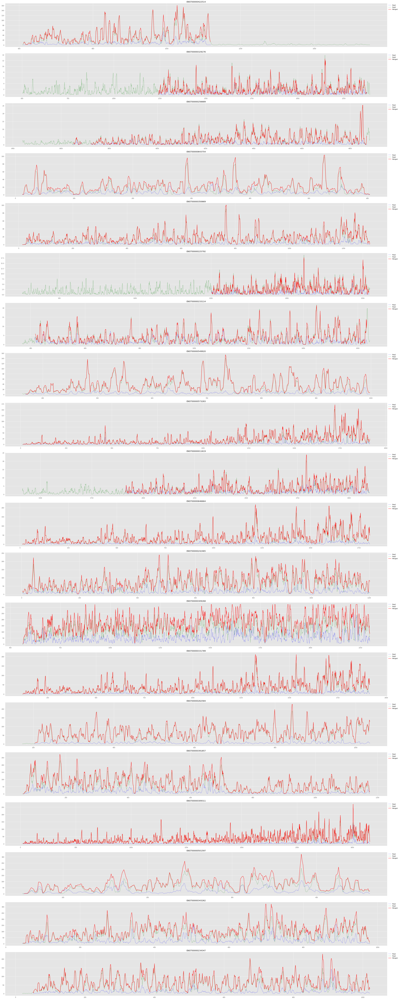

In [108]:
context = 2

all_fn = "text_output_tombo/tombo_pvalues.tsv.gz"
all_df = pd.read_csv(all_fn, sep="\t")

merged_fn = "text_output_tombo/tombo_pvalues_combined.tsv.gz"
merged_df = pd.read_csv(merged_fn, sep="\t")

# Get selected transcripts
transcripts = [
    'ENST00000422514','ENST00000329276','ENST00000256689','ENST00000643754','ENST00000350669','ENST00000225792','ENST00000233114','ENST00000549920','ENST00000573283','ENST00000011619',
    'ENST00000646664','ENST00000242465','ENST00000309268','ENST00000331789','ENST00000262584','ENST00000391857','ENST00000309311','ENST00000501597','ENST00000343262','ENST00000234347']

with pl.style.context("ggplot"):
    fig, axes = pl.subplots(len(transcripts), 1, figsize=(40, 5*len(transcripts)))   
    for ax, tx in zip(axes, transcripts):
        all_tx_df = all_df[all_df.ref_id==tx]
        merged_tx_df = merged_df[merged_df.ref_id==tx]
        
        _ = ax.plot(all_tx_df["pos"], -np.log10(all_tx_df[f"Rep1_context_{context}_pvalue"]), color="blue", ls="--", alpha=0.5, label="Rep1")
        _ = ax.plot(all_tx_df["pos"], -np.log10(all_tx_df[f"Rep2_context_{context}_pvalue"]), color="green", ls="--", alpha=0.5, label="Rep2")
        _ = ax.plot(merged_tx_df["pos"], -np.log10(merged_tx_df[f"merged_context_{context}_pvalue"]), color="red", label="Merged")
        _ = ax.legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
        _ = ax.set_title(tx)
    
    fig.tight_layout()

### Peak calling vizualisation

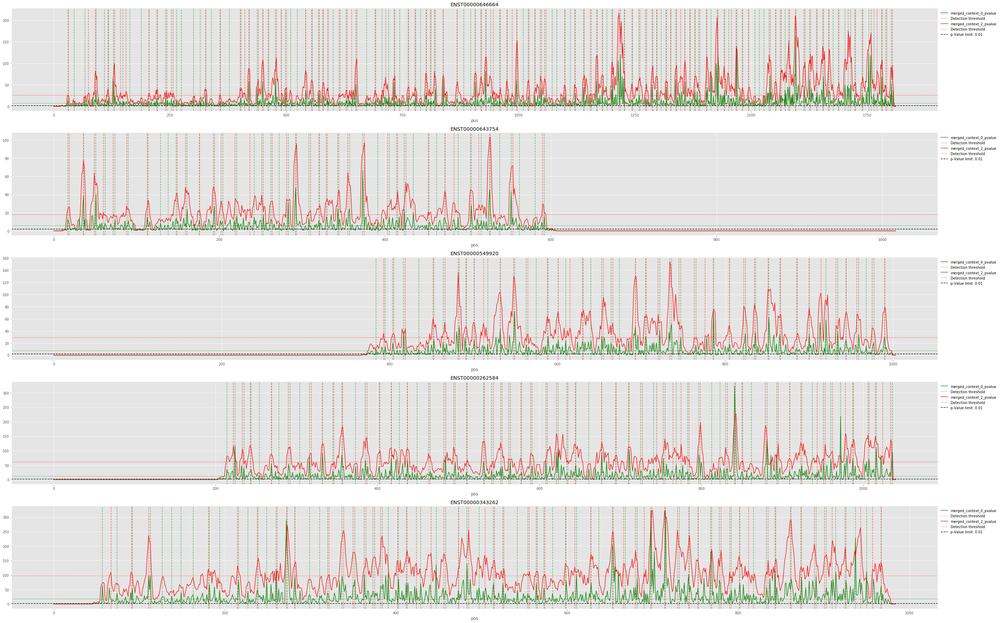

In [114]:
# Get tombo data
out_dir = "text_output_tombo"

merged_fn = os.path.join(out_dir, "tombo_pvalues_combined.tsv.gz")
merged_df = pd.read_csv(merged_fn, sep="\t")

# Get transcript lengths
tx_len_dict = OrderedDict()
with pyfaidx.Fasta("/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa") as fa:
    for i in fa:
        tx_len_dict[i.name]= len(i)

# Get selected transcripts
# transcripts = [
#     'ENST00000422514','ENST00000329276','ENST00000256689','ENST00000643754','ENST00000350669','ENST00000225792','ENST00000233114','ENST00000549920','ENST00000573283','ENST00000011619',
#     'ENST00000646664','ENST00000242465','ENST00000309268','ENST00000331789','ENST00000262584','ENST00000391857','ENST00000309311','ENST00000501597','ENST00000343262','ENST00000234347']
transcripts = ["ENST00000646664", 'ENST00000643754', 'ENST00000549920', 'ENST00000262584', 'ENST00000343262']

p_val_lim = 0.01
quantile_lim = 0.5
min_distance = 9
sig_lim = -np.log10(p_val_lim)

with pl.style.context("ggplot"):
    fig, axes = pl.subplots(len(transcripts), 1, figsize=(40, 5*len(transcripts)))
    i = 0
    
    for ax, tx in zip(axes, transcripts):
        tx_len = tx_len_dict[tx]
        res = merged_df[merged_df.ref_id==tx]
        res = res.drop(columns="ref_id")
        res = res.set_index("pos")
        
        for color, test in [
            ("green", "merged_context_0_pvalue"),
#             ("blue", "merged_context_1_pvalue"),
            ("red", "merged_context_2_pvalue")]:
            
            # transform data
            x = -np.log10(res[test])
            x = x.reindex(range(tx_len))
            x = x.fillna(0)
            
            # Calculate dynamic peak valling threshold
            sig_val = x[x>sig_lim]
            if sig_val.empty:
                threshold = sig_lim
            else:
                threshold = np.quantile(sig_val, quantile_lim)
                if threshold < sig_lim:
                    threshold = sig_lim
            
            # call peaks and plot
            peaks, extra = find_peaks(x, height=threshold, distance=min_distance)
            x.plot(ax=ax, color=color, alpha=0.9)
            
            for p in peaks:
                _ = ax.axvline(p, ls="--", color=color, alpha=0.5)
            _ = ax.axhline(threshold, ls=":",  color=color, alpha=0.75, label="Detection threshold")
        
        # General opt
        _ = ax.axhline(sig_lim, c="0.1", ls="--", label=f"p-Value limit: {p_val_lim}")
        _ = ax.legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
        _ = ax.set_title (tx)
            
    fig.tight_layout()

### Peak calling across whole dataset

In [121]:
# Set Variables 
p_val_lim = 0.01
quantile_lim = 0.5
min_distance = 9
sig_lim = -np.log10(p_val_lim)

# IO
in_fn = "text_output_tombo/tombo_pvalues_combined.tsv.gz"
tx_fasta = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
out_fn = "text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz"

# Tests to use for peak calling
tests = ["merged_context_0_pvalue","merged_context_1_pvalue","merged_context_2_pvalue","merged_context_3_pvalue"]

# Get data
in_df = pd.read_csv(in_fn, sep="\t")

# Get transcript lengths
tx_len_dict = OrderedDict()
with pyfaidx.Fasta(tx_fasta) as fa:
    for i in fa:
        tx_len_dict[i.name]= len(i)

all_tx_list = []

for tx, tx_df in tqdm (in_df.groupby("ref_id"), total=in_df["ref_id"].nunique()):
    tx_len = tx_len_dict[tx]
    tx_df = tx_df.copy()
    tx_df_extended = tx_df.copy()
    tx_df_extended = tx_df_extended.drop(columns="ref_id")
    tx_df_extended = tx_df_extended.set_index("pos")
    tx_df_extended = -np.log10(tx_df_extended)
    
    # reindex position to match full transcript length 
    tx_df_extended = tx_df_extended.reindex(range(tx_len))
    tx_df_extended = tx_df_extended.fillna(0)
    
    for test in tests:
        x = tx_df_extended[test]
        
        # Calculate dynamic peak calling threshold
        sig_val = x[x>sig_lim]
        if sig_val.empty:
            threshold = sig_lim
        else:
            threshold = np.quantile(sig_val, quantile_lim)
            if threshold < sig_lim:
                threshold = sig_lim
        
        # Call peaks
        peaks, extra = find_peaks(x, height=threshold, distance=min_distance)
        
        # Copy detected peaks back to tx_df in boolean encoding 
        mod_status_list = []
        for pos, pval in zip(tx_df["pos"], tx_df[test]):
            if pd.isna(pval):
                mod_status = np.nan
            elif pos in peaks:
                mod_status = True
            else:
                mod_status = False
            mod_status_list.append(mod_status)
        peak_field = test.replace("pvalue", "peaks")
        tx_df[peak_field] = mod_status_list    
    all_tx_list.append(tx_df)

# Merge data
all_tx_df = pd.concat(all_tx_list)
all_tx_df.to_csv(out_fn, sep="\t", index=False)

# Display first peaks for each context
for test in tests:
    peak_field = test.replace("pvalue", "peaks")
    print (f"Examples of peaks found for {peak_field}")
    display(all_tx_df[all_tx_df[peak_field]==True].sample(5))

100%|██████████| 1006/1006 [00:26<00:00, 37.79it/s]


Examples of peaks found for merged_context_0_peaks


,ref_id,pos,merged_context_0_pvalue,merged_context_1_pvalue,merged_context_2_pvalue,merged_context_3_pvalue,merged_context_0_peaks,merged_context_1_peaks,merged_context_2_peaks,merged_context_3_peaks
610775,ENST00000484616,242,3.948232e-04,3.670016e-05,1.250082e-07,3.472953e-08,True,False,True,False
740023,ENST00000615060,355,2.515219e-06,3.766163e-10,1.492946e-08,6.366220e-08,True,True,False,False
639693,ENST00000521262,465,6.326105e-07,7.479002e-06,2.851905e-04,5.952441e-06,True,False,False,False
316577,ENST00000336032,1007,1.455671e-04,5.636662e-06,3.101632e-08,9.412210e-07,True,False,True,False
404075,ENST00000369817,1111,1.148645e-49,3.224888e-107,1.661355e-133,1.408673e-135,True,True,False,False


Examples of peaks found for merged_context_1_peaks


,ref_id,pos,merged_context_0_pvalue,merged_context_1_pvalue,merged_context_2_pvalue,merged_context_3_pvalue,merged_context_0_peaks,merged_context_1_peaks,merged_context_2_peaks,merged_context_3_peaks
648741,ENST00000525428,573,0.000079,2.070886e-08,3.229579e-07,3.777361e-07,False,True,False,False
157918,ENST00000274137,373,0.254679,1.466165e-11,5.286310e-13,2.106417e-15,False,True,False,False
259810,ENST00000316963,2529,0.505051,1.616022e-08,1.974747e-11,4.975582e-15,False,True,False,False
625963,ENST00000508595,382,0.023173,3.361282e-08,6.236628e-09,1.297192e-10,False,True,False,False
304549,ENST00000332598,548,0.053675,3.825254e-07,5.591614e-07,5.347088e-07,False,True,False,False


Examples of peaks found for merged_context_2_peaks


,ref_id,pos,merged_context_0_pvalue,merged_context_1_pvalue,merged_context_2_pvalue,merged_context_3_pvalue,merged_context_0_peaks,merged_context_1_peaks,merged_context_2_peaks,merged_context_3_peaks
84951,ENST00000252818,1390,2.000303e-05,5.707778e-19,4.646101e-33,3.177701e-37,False,False,True,True
644437,ENST00000521861,1221,9.355949e-08,4.203281e-26,2.017490e-44,9.965181e-45,False,False,True,False
291666,ENST00000330029,241,3.421117e-03,1.586174e-06,1.307908e-06,6.979440e-06,False,True,True,False
16010,ENST00000216146,1318,7.246756e-09,8.733764e-59,4.126621e-65,9.599393e-69,False,False,True,False
675280,ENST00000540430,1182,1.908192e-01,4.380138e-04,1.384062e-05,5.915928e-05,False,False,True,False


Examples of peaks found for merged_context_3_peaks


,ref_id,pos,merged_context_0_pvalue,merged_context_1_pvalue,merged_context_2_pvalue,merged_context_3_pvalue,merged_context_0_peaks,merged_context_1_peaks,merged_context_2_peaks,merged_context_3_peaks
763562,ENST00000648437,206,4.464794e-04,4.219967e-07,6.208200e-18,1.568282e-33,False,False,False,True
426754,ENST00000373365,1078,2.463069e-02,3.103436e-05,2.063665e-06,5.939993e-08,False,False,False,True
41061,ENST00000228306,1035,3.437459e-04,7.867173e-16,1.726000e-38,2.311322e-67,False,False,False,True
40564,ENST00000228306,538,5.793096e-17,5.095791e-33,3.176643e-46,6.746892e-51,False,False,False,True
572372,ENST00000438552,473,7.945054e-06,1.237016e-10,1.611842e-12,2.549963e-13,False,False,False,True


## Epinano

In [176]:
out_dir = "text_output_epinano" 
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/text_output_epinano


### Merge samples data and filter low coverage regions

In [330]:
out_dir = "text_output_epinano" 
out_fn = os.path.join(out_dir, "Epinano_score.tsv.gz")
all_df = pd.DataFrame(columns=["ref_id", "pos"])
min_reads = 30

for sample_id in ("KD_1","KD_2", "WT_1", "WT_2"):
    data_fn = f"/hps/nobackup/enright/tom/nanocompore_paper_analyses/benchmarks/epinano/analysis/METTL3_KD/epinano_predictions/{sample_id}_parsed.txt"
    
    print (f"parse {sample_id}")
    score_field = f"score_{sample_id}"
    coverage_field = f"coverage_{sample_id}"
    s_df = pd.read_csv(data_fn, sep="\t", names=["ref_id", "pos", coverage_field, score_field], usecols=[0,2,3,4])
    print("\tPositions before filtering: {:,}".format(len(s_df)))
    s_df = s_df[s_df[coverage_field]>=min_reads]
    print("\tPositions after filtering: {:,}".format(len(s_df)))
    #s_df = s_df[["ref_id", "pos", score_field]]
    all_df = pd.merge(all_df, s_df, on=["ref_id","pos"], how="outer")

all_df = all_df.sort_values(by=["ref_id", "pos"])
all_df = all_df.reset_index(drop=True)
all_df.to_csv(out_fn, sep="\t", index=False)
display(all_df.head())

parse KD_1
	Positions before filtering: 614,232
	Positions after filtering: 355,719
parse KD_2
	Positions before filtering: 1,598,012
	Positions after filtering: 1,029,433
parse WT_1
	Positions before filtering: 616,670
	Positions after filtering: 364,173
parse WT_2
	Positions before filtering: 1,090,574
	Positions after filtering: 691,936


,ref_id,pos,coverage_KD_1,score_KD_1,coverage_KD_2,score_KD_2,coverage_WT_1,score_WT_1,coverage_WT_2,score_WT_2
0,ENST00000009589,6,NaN,NaN,45.0,0.348176,NaN,NaN,NaN,NaN
1,ENST00000009589,7,NaN,NaN,72.0,0.389838,NaN,NaN,40.0,0.626567
2,ENST00000009589,8,49.0,0.331204,110.0,0.327399,40.0,0.317296,62.0,0.342440
3,ENST00000009589,9,88.0,0.305004,220.0,0.255845,79.0,0.260886,129.0,0.254854
4,ENST00000009589,10,162.0,0.238827,343.0,0.208623,154.0,0.190820,198.0,0.182147


### Calculate modification ratio and detect putative modified sites 

In [5]:
out_dir = "text_output_epinano"
in_fn = os.path.join(out_dir, "Epinano_score.tsv.gz")
out_fn = os.path.join(out_dir, "Epinano_mod_calls.tsv.gz")

# Load values
stdout_print("Load Data\n")
val_df = pd.read_csv(in_fn, sep="\t")

stdout_print("Calculate modification status\n")
l = []
# Calculate modification ratio based on epinano paper
for idx, line in tqdm(val_df.iterrows(), total=len(val_df)):
    d = OrderedDict()
    d["ref_id"]= line.ref_id
    d["pos"]= line.pos
    
    # Calculate KD score
    if line.score_KD_1 is np.nan or line.score_KD_2 is np.nan:
        d["KD_mean"] = np.nan
    else:
        d["KD_mean"] = np.mean((line.score_KD_1, line.score_KD_2))
    
    # Calculate WT score
    if line.score_WT_1 is np.nan or line.score_WT_2 is np.nan:
        d["WT_mean"] = np.nan
    else:
        d["WT_mean"] = np.mean((line.score_WT_1, line.score_WT_2))
    
    # Calculate ratio
    if pd.isna(d["KD_mean"]) and pd.isna(d["WT_mean"]):
        continue
        
    if pd.isna(d["KD_mean"]) or pd.isna(d["WT_mean"]):
        d["mod_ratio"] = np.nan
        d["mod_status"] = np.nan
    else:
        d["mod_ratio"] = d["WT_mean"]/d["KD_mean"]
        d["mod_status"] = True if d["mod_ratio"] > 1.5 and d["WT_mean"] > 0.5 else False
    
    l.append(d)

df = pd.DataFrame(l)
df.to_csv(out_fn, sep="\t", index=False)
display(df.head())

Load Data
Calculate modification status


100%|██████████| 1061966/1061966 [07:01<00:00, 2519.22it/s]


,ref_id,pos,KD_mean,WT_mean,mod_ratio,mod_status
0,ENST00000009589,8,0.329302,0.329868,1.001720,False
1,ENST00000009589,9,0.280424,0.257870,0.919572,False
2,ENST00000009589,10,0.223725,0.186484,0.833538,False
3,ENST00000009589,11,0.270676,0.248100,0.916593,False
4,ENST00000009589,12,0.379971,0.378814,0.996954,False


### Plot detected modifications

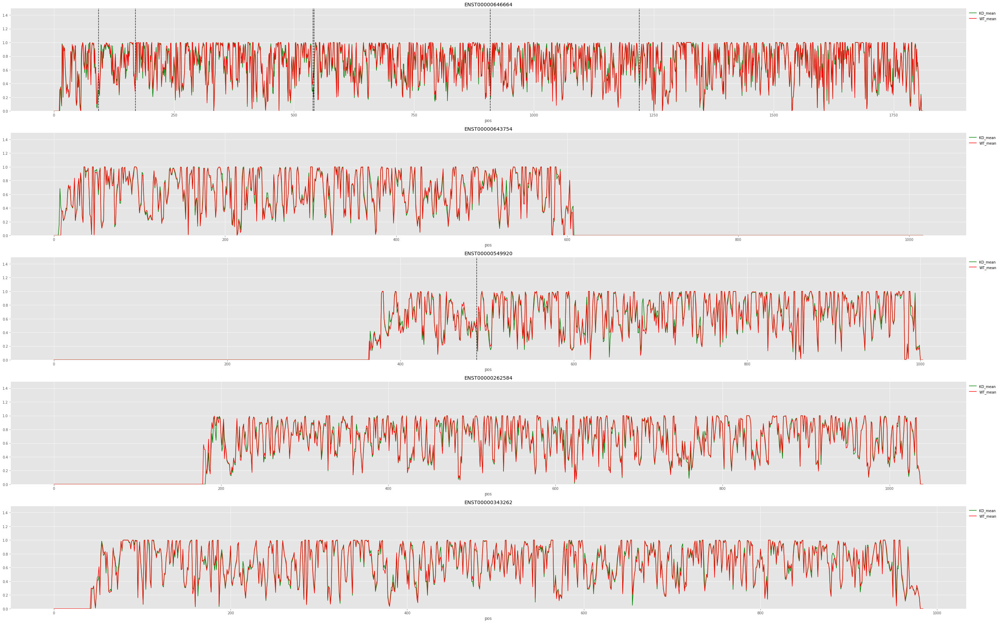

In [113]:
# Get tombo data
df = pd.read_csv('text_output_epinano/Epinano_mod_calls.tsv.gz', sep="\t")

# Get transcript lengths
tx_len_dict = OrderedDict()
with pyfaidx.Fasta("/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa") as fa:
    for i in fa:
        tx_len_dict[i.name]= len(i)

# Get selected transcripts
# transcripts = [
#     'ENST00000422514','ENST00000329276','ENST00000256689','ENST00000643754','ENST00000350669','ENST00000225792','ENST00000233114','ENST00000549920','ENST00000573283','ENST00000011619',
#     'ENST00000646664','ENST00000242465','ENST00000309268','ENST00000331789','ENST00000262584','ENST00000391857','ENST00000309311','ENST00000501597','ENST00000343262','ENST00000234347']
transcripts = ["ENST00000646664", 'ENST00000643754', 'ENST00000549920', 'ENST00000262584', 'ENST00000343262']

with pl.style.context("ggplot"):
    fig, axes = pl.subplots(len(transcripts), 1, figsize=(40, 5*len(transcripts)))
    i = 0
    
    for ax, tx in zip(axes, transcripts):
        tx_len = tx_len_dict[tx]
        res = df[df.ref_id==tx]
        res = res.drop(columns="ref_id")
        res = res.set_index("pos")
        
        for color, test in [
            ("green", "KD_mean"),
            ("red", "WT_mean")]:

            x = res[test]
            x = x.reindex(range(tx_len))
            x = x.fillna(0)
            x.plot(ax=ax, color=color)
            
            for p in res[res.mod_status == True].index:
                _ = ax.axvline(p, ls="--", color="black", alpha=0.5)
                
        # General opt
        _ = ax.set_ylim(0,1.5)
        _ = ax.legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
        _ = ax.set_title (tx)
            
    fig.tight_layout()

## Nanocompore

In [5]:
out_dir = "text_output_nanocompore" 
rmtree (out_dir, ignore_errors=True)
mkdir (out_dir)

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/text_output_nanocompore


### Peak calling vizualisation

In [89]:
import numpy as np

def call_nanocompore_peaks(nanocompore_fn, test, transcripts, color="firebrick", outdir = "./", p_val_lim=0.01, quantile_lim=0.5, min_distance=9):

    # Set Variables 
    sig_lim = -np.log10(p_val_lim)

    # Get data
    in_df = pd.read_csv(nanocompore_fn, sep="\t")
    in_df = in_df[["ref_id", "pos", test]]

    for tx in transcripts:
        tx_df = in_df[in_df.ref_id==tx].copy()
        tx_df = tx_df.drop(columns="ref_id")
        tx_df = tx_df.set_index("pos")
        tx_df = -np.log10(tx_df)
        min_pos = tx_df.index.min()
        max_pos = tx_df.index.max()

        # reindex position to match full transcript length 
        tx_df = tx_df.reindex(range(min_pos,max_pos+1))
        tx_df = tx_df.fillna(0)
        x = tx_df[test]
        x = x.clip(0)
        
        # Calculate dynamic peak calling threshold
        sig_val = x[x>sig_lim]
        if sig_val.empty:
            threshold = sig_lim
        else:
            threshold = np.quantile(sig_val, quantile_lim)
            if threshold < sig_lim:
                threshold = sig_lim

        # Call peaks
        peaks, extra = find_peaks(x, height=threshold, distance=min_distance)

        with pl.style.context("ggplot"):
            fig, ax = pl.subplots(figsize=(20, 5))

            ax.fill_betweenx(x1=x.index, x2=0, y=x.values, color=color, alpha=0.5)

            for p in peaks:
                _ = ax.axvline(p+min_pos, ls="--", color=color)

            # General opt
            _ = ax.axhline(sig_lim, c="0.1", ls="--", label=f"p-Value limit: {p_val_lim}")
            _ = ax.legend(bbox_to_anchor=(1, 1), loc=2, facecolor="white", frameon=False)
            _ = ax.set_xlim(min_pos,max_pos)
            _ = ax.set_ylim(0,None)
            _ = ax.set_title (tx)
            
            fig.savefig(os.path.join(outdir, f"{tx}_{test}.svg"), format="svg")

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_paper_analyses/tombo_epinano_comparison/peak_calling_nanocompore


/nfs/software/birney/miniconda3/envs/Python3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/nfs/software/birney/miniconda3/envs/Python3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/nfs/software/birney/miniconda3/envs/Python3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/nfs/software/birney/miniconda3/envs/Python3.7/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot inter

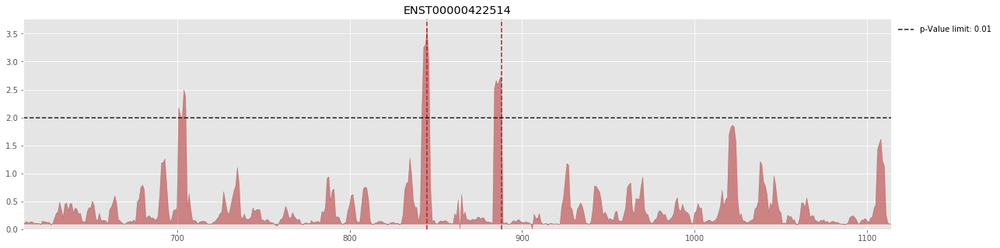

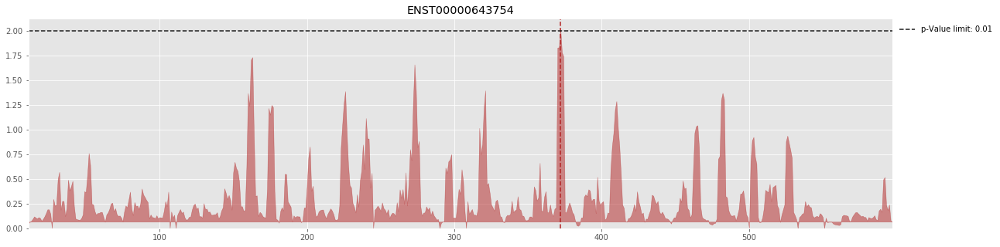

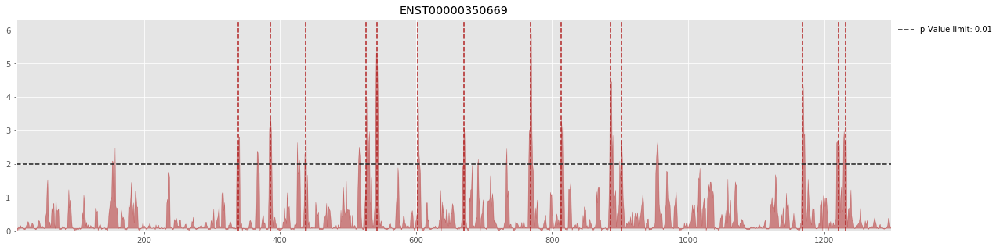

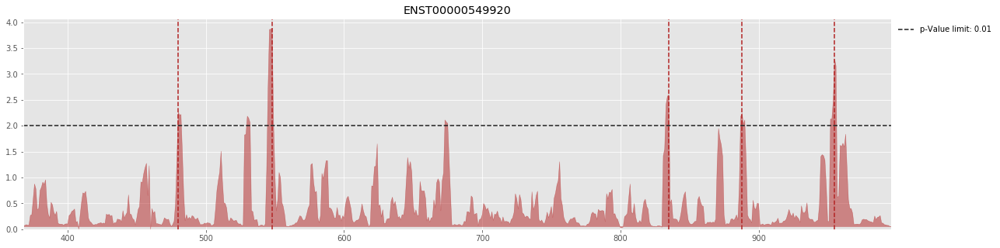

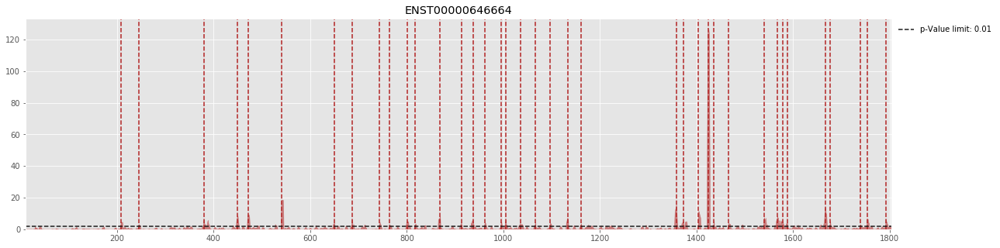

...

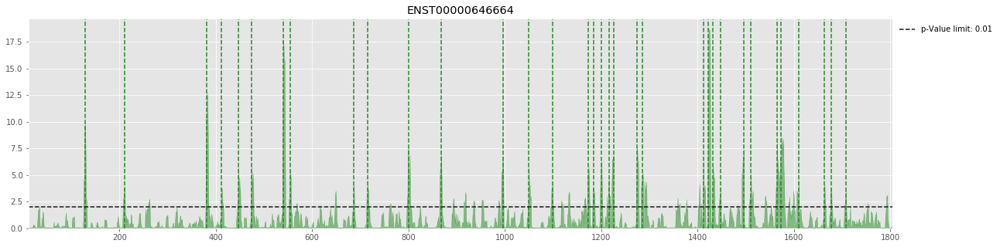

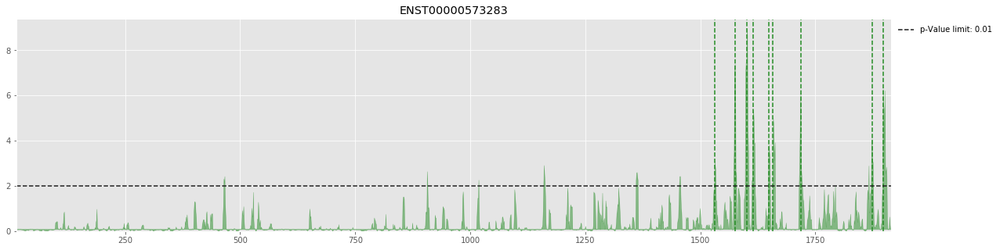

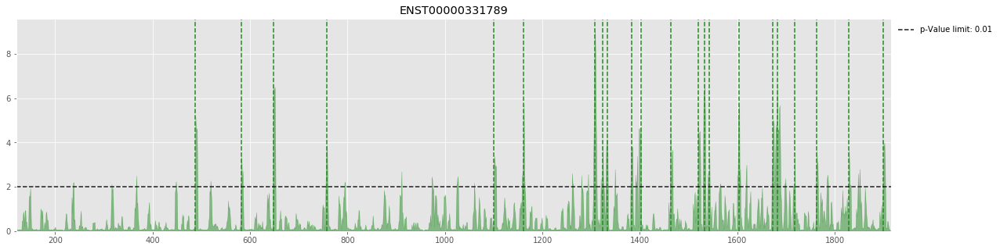

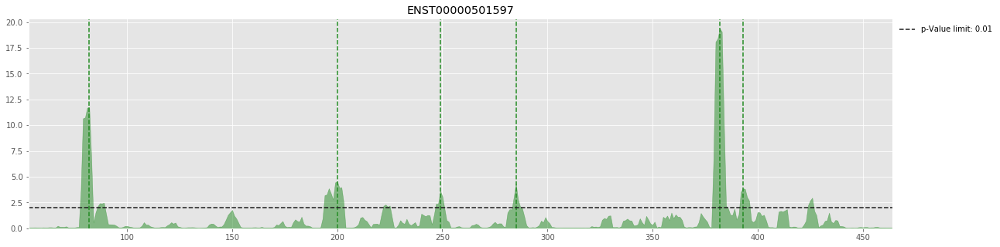

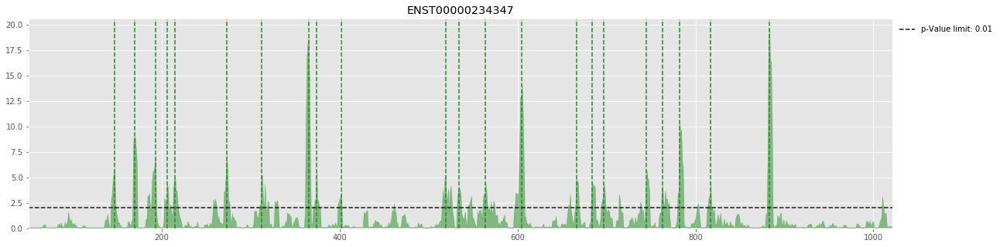

In [90]:
outdir = "peak_calling_nanocompore" 
rmtree (outdir, ignore_errors=True)
mkdir (outdir)

call_nanocompore_peaks(
    nanocompore_fn = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/nanocompore/out_nanocompore_results.tsv",
    test = "GMM_logit_pvalue_context_2",
    transcripts = ['ENST00000422514','ENST00000643754','ENST00000350669','ENST00000549920','ENST00000646664','ENST00000573283', 'ENST00000331789','ENST00000501597','ENST00000234347'],
    color="firebrick",
    outdir = outdir,
    p_val_lim=0.01,
    quantile_lim=0.5,
    min_distance=9)

call_nanocompore_peaks(
    nanocompore_fn = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/nanocompore/out_nanocompore_results.tsv",
    test = "KS_intensity_pvalue_context_2",
    transcripts = ['ENST00000422514','ENST00000643754','ENST00000350669','ENST00000549920','ENST00000646664','ENST00000573283', 'ENST00000331789','ENST00000501597','ENST00000234347'],
    color="darkslateblue",
    outdir = outdir,
    p_val_lim=0.01,
    quantile_lim=0.5,
    min_distance=9)

call_nanocompore_peaks(
    nanocompore_fn = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/nanocompore/out_nanocompore_results.tsv",
    test = "KS_dwell_pvalue_context_2",
    transcripts = ['ENST00000422514','ENST00000643754','ENST00000350669','ENST00000549920','ENST00000646664','ENST00000573283', 'ENST00000331789','ENST00000501597','ENST00000234347'],
    color="forestgreen",
    outdir = outdir,
    p_val_lim=0.01,
    quantile_lim=0.5,
    min_distance=9)

### Peak calling across whole dataset

In [104]:
# Set Variables 
p_val_lim = 0.01
quantile_lim = 0.5
min_distance = 9
sig_lim = -np.log10(p_val_lim)

# IO
in_fn =  "/hps/nobackup/enright/tom/nanocompore_paper_analyses/nanocompore_pipelines/METTL3_KD_polyA/results/nanocompore/out_nanocompore_results.tsv.gz"
tx_fasta = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
out_fn = "text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz"

# Tests to use for peak calling
tests = ["GMM_logit_pvalue","KS_dwell_pvalue","KS_intensity_pvalue","GMM_logit_pvalue_context_2","KS_dwell_pvalue_context_2","KS_intensity_pvalue_context_2"]

# Get data
in_df = pd.read_csv(in_fn, sep="\t", dtype={'chr':str})
in_df = in_df[["ref_id", "pos"]+tests]

# Get transcript lengths
tx_len_dict = OrderedDict()
with pyfaidx.Fasta(tx_fasta) as fa:
    for i in fa:
        tx_len_dict[i.name]= len(i)

all_tx_list = []

for tx, tx_df in tqdm (in_df.groupby("ref_id"), total=in_df["ref_id"].nunique()):
    tx_len = tx_len_dict[tx]
    tx_df = tx_df.copy()
    tx_df_extended = tx_df.copy()
    tx_df_extended = tx_df_extended.drop(columns="ref_id")
    tx_df_extended = tx_df_extended.set_index("pos")
    tx_df_extended = -np.log10(tx_df_extended)
    
    # reindex position to match full transcript length 
    tx_df_extended = tx_df_extended.reindex(range(tx_len))
    tx_df_extended = tx_df_extended.fillna(0)
    
    for test in tests:
        x = tx_df_extended[test]
        
        # Calculate dynamic peak calling threshold
        sig_val = x[x>sig_lim]
        if sig_val.empty:
            threshold = sig_lim
        else:
            threshold = np.quantile(sig_val, quantile_lim)
            if threshold < sig_lim:
                threshold = sig_lim
        
        # Call peaks
        peaks, extra = find_peaks(x, height=threshold, distance=min_distance)
        
        # Copy detected peaks back to tx_df in boolean encoding 
        mod_status_list = []
        for pos, pval in zip(tx_df["pos"], tx_df[test]):
            if pd.isna(pval):
                mod_status = np.nan
            elif pos in peaks:
                mod_status = True
            else:
                mod_status = False
            mod_status_list.append(mod_status)
        peak_field = test.replace("pvalue", "peaks")
        tx_df[peak_field] = mod_status_list    
    all_tx_list.append(tx_df)

# Merge data
all_tx_df = pd.concat(all_tx_list)
all_tx_df.to_csv(out_fn, sep="\t", index=False)

# Display first peaks for each context
for test in tests:
    peak_field = test.replace("pvalue", "peaks")
    print (f"Examples of peaks found for {peak_field}")
    display(all_tx_df[all_tx_df[peak_field]==True].sample(5))

100%|██████████| 752/752 [00:31<00:00, 24.13it/s]


Examples of peaks found for GMM_logit_peaks


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
673410,ENST00000234347,818,1.355301e-04,9.722369e-01,1.308856e-10,0.000101,0.145211,2.643103e-14,True,False,False,False,False,False
651509,ENST00000302907,324,5.059078e-04,9.989744e-01,1.593804e-02,0.104416,0.822741,7.109733e-02,True,False,False,False,False,False
196567,ENST00000296674,593,8.736448e-09,6.457881e-04,6.804243e-23,0.031303,0.021219,7.600714e-09,True,True,False,False,False,False
273061,ENST00000230050,450,7.754969e-12,4.025042e-08,6.332104e-21,0.002869,0.000121,3.787988e-16,True,True,False,False,True,False
503341,ENST00000311549,623,4.920075e-05,8.478074e-01,1.972811e-17,0.098062,0.172030,2.910282e-25,True,False,False,False,False,True


Examples of peaks found for KS_dwell_peaks


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
364381,ENST00000321153,479,0.000023,5.243681e-05,5.826923e-12,0.006222,0.012718,4.678593e-08,False,True,False,False,False,False
605604,ENST00000307961,1169,0.494376,3.149900e-04,2.536843e-07,0.058417,0.296376,6.859677e-10,False,True,False,False,False,False
17003,ENST00000319248,213,0.000842,5.367026e-04,6.447870e-05,0.096608,0.013119,2.168587e-05,True,True,False,False,False,True
672783,ENST00000234347,191,0.094855,1.729589e-08,1.904411e-08,0.558516,0.000004,2.108607e-17,False,True,False,False,False,False
395917,ENST00000329251,440,0.913993,1.038691e-03,9.027193e-01,0.528730,0.154148,1.356519e-02,False,True,False,False,False,False


Examples of peaks found for KS_intensity_peaks


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
458855,ENST00000552981,1003,0.649045,0.519050,6.459129e-06,0.802971,0.834450,0.000006,False,False,True,False,False,False
434679,ENST00000262033,1056,0.548547,0.990683,4.750462e-04,0.705705,0.834167,0.001727,False,False,True,False,False,False
371806,ENST00000273550,196,0.161417,0.067365,2.115649e-10,0.586697,0.241730,0.000015,False,False,True,False,False,False
521943,ENST00000044462,478,0.959653,0.787054,4.822764e-05,0.865598,0.829134,0.094483,False,False,True,False,False,False
453492,ENST00000546500,982,0.444932,1.000000,1.698585e-19,0.733233,0.828699,0.000013,False,False,True,False,False,False


Examples of peaks found for GMM_logit_peaks_context_2


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
202023,ENST00000648437,135,0.048407,1.000000,0.018641,8.633210e-05,8.357430e-01,1.949348e-03,False,False,False,True,False,False
301221,ENST00000646664,1543,0.701625,0.039014,0.797544,1.876094e-08,8.359861e-08,5.915294e-19,False,False,False,True,True,False
395495,ENST00000323345,783,0.963034,1.000000,0.417932,2.460459e-05,1.105335e-02,7.154816e-05,False,False,False,True,False,False
208213,ENST00000322203,79,0.012113,1.000000,0.000315,2.921800e-04,4.281476e-02,2.094052e-05,False,False,False,True,False,False
686406,ENST00000389680,803,0.007416,0.378768,0.036643,3.470792e-06,5.309051e-01,7.833917e-28,False,False,False,True,False,True


Examples of peaks found for KS_dwell_peaks_context_2


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
622179,ENST00000573283,1601,9.095730e-01,4.298978e-01,1.831120e-02,0.000002,2.608941e-12,1.228571e-23,False,False,False,False,True,False
686720,ENST00000391857,229,2.605716e-01,1.805932e-03,6.883641e-07,0.000047,7.531846e-06,1.294183e-21,False,False,False,False,True,False
397649,ENST00000380394,682,6.126418e-10,2.166574e-19,2.478056e-05,0.007120,7.165762e-13,1.589451e-33,True,False,False,False,True,False
616296,ENST00000343986,195,1.959631e-02,3.043201e-02,4.714970e-05,0.007448,2.829546e-03,1.567336e-06,False,False,True,False,True,False
467469,ENST00000242465,1139,6.957693e-01,3.039874e-01,1.678906e-08,0.000022,3.244614e-14,3.256042e-30,False,False,False,False,True,False


Examples of peaks found for KS_intensity_peaks_context_2


,ref_id,pos,GMM_logit_pvalue,KS_dwell_pvalue,KS_intensity_pvalue,GMM_logit_pvalue_context_2,KS_dwell_pvalue_context_2,KS_intensity_pvalue_context_2,GMM_logit_peaks,KS_dwell_peaks,KS_intensity_peaks,GMM_logit_peaks_context_2,KS_dwell_peaks_context_2,KS_intensity_peaks_context_2
80642,ENST00000366815,769,0.973548,1.000000,9.885882e-01,0.708717,0.840402,2.343706e-11,False,False,False,False,False,True
364400,ENST00000321153,498,0.907261,1.000000,4.104241e-07,0.158504,0.000661,6.191771e-23,False,False,False,False,True,True
372445,ENST00000273550,835,0.914993,0.623807,9.368104e-07,0.757362,0.760058,2.358276e-07,False,False,False,False,False,True
182871,ENST00000259873,1357,NaN,1.000000,2.322160e-03,NaN,0.985264,1.945021e-03,NaN,False,False,NaN,False,True
401500,ENST00000372134,1095,0.953073,0.997382,1.019879e-01,0.760636,0.503381,8.486222e-04,False,False,False,False,False,True


## Comparison

### Count peaks per fields

In [41]:
print("Load Dataframe")
tombo_fn = "text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz"
epinano_fn = "text_output_epinano/Epinano_mod_calls.tsv.gz"
nanocompore_fn = "text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz"
tombo_df = pd.read_csv(tombo_fn, sep="\t")
epinano_df = pd.read_csv(epinano_fn, sep="\t")
nanocompore_df = pd.read_csv(nanocompore_fn, sep="\t")

print ("iterate over data fields")

tombo_fields = [
    ["Tombo_context_0", "merged_context_0_pvalue", "merged_context_0_peaks"],
    ["Tombo_context_1", "merged_context_1_pvalue", "merged_context_1_peaks"],
    ["Tombo_context_2", "merged_context_2_pvalue", "merged_context_2_peaks"],
    ["Tombo_context_3", "merged_context_3_pvalue", "merged_context_3_peaks"]]

epinano_fields = [
    ["Epinano", "mod_ratio", "mod_status"]]

nanocompore_fields = [
    ["Nanocompore_GMM_context_0", "GMM_logit_pvalue", "GMM_logit_peaks"],
    ["Nanocompore_KS_dwell_context_0", "KS_dwell_pvalue", "KS_dwell_peaks"],
    ["Nanocompore_KS_intensity_context_0", "KS_intensity_pvalue", "KS_intensity_peaks"],
    ["Nanocompore_GMM_context_2", "GMM_logit_pvalue_context_2", "GMM_logit_peaks_context_2"],
    ["Nanocompore_KS_dwell_context_2", "KS_dwell_pvalue_context_2", "KS_dwell_peaks_context_2"],
    ["Nanocompore_KS_intensity_context_2", "KS_intensity_pvalue_context_2", "KS_intensity_peaks_context_2"]]

c = defaultdict(OrderedDict)
for df, fields in ((tombo_df, tombo_fields), (epinano_df, epinano_fields), (nanocompore_df, nanocompore_fields)):
    
    for label, score, status in fields:
        field_df = df[["ref_id", "pos", score, status]]
        field_df = field_df.dropna(subset=[score, status])
        
        n_kmers = len(field_df[field_df[score]<=0.01])
        n_peaks = len(field_df[field_df[status] == True])
        
        c[label]["Number of significant kmers"] = n_kmers
        c[label]["Number of peaks"] = n_peaks
        c[label]["% sig kmers called per bases"] = round(n_kmers/len(field_df)*100, 2)
        c[label]["% peak called per bases"] = round(n_peaks/len(field_df)*100, 2)
        c[label]["Unique transcripts"] = field_df["ref_id"].nunique()
        c[label]["Unique transcripts with sig Kmer"] = field_df[field_df[score]<=0.01]["ref_id"].nunique()
        c[label]["Unique transcripts with peak"] = field_df[field_df[status] == True]["ref_id"].nunique()
        c[label]["Unique transcripts without sig Kmer"] = c[label]["Unique transcripts"] - c[label]["Unique transcripts with sig Kmer"]
        c[label]["Unique transcripts without peak"] = c[label]["Unique transcripts"] - c[label]["Unique transcripts with peak"]
        
df = pd.DataFrame.from_dict(c, orient="index")
df = df.sort_index()
display(df)

Load Dataframe
iterate over data fields


,Number of significant kmers,Number of peaks,% sig kmers called per bases,% peak called per bases,Unique transcripts,Unique transcripts with sig Kmer,Unique transcripts with peak,Unique transcripts without sig Kmer,Unique transcripts without peak
Epinano,200,2391,0.06,0.76,437,146,347,291,90
Nanocompore_GMM_context_0,6021,2376,0.99,0.39,751,437,437,314,314
Nanocompore_GMM_context_2,11995,1570,1.96,0.26,751,216,216,535,535
Nanocompore_KS_dwell_context_0,4499,1774,0.65,0.25,752,352,352,400,400
Nanocompore_KS_dwell_context_2,9025,1221,1.30,0.18,752,182,182,570,570
Nanocompore_KS_intensity_context_0,87442,20733,12.57,2.98,752,746,746,6,6
Nanocompore_KS_intensity_context_2,134677,12596,19.36,1.81,752,677,677,75,75
Tombo_context_0,255406,42081,33.34,5.49,1006,1006,1006,0,0
Tombo_context_1,434228,41302,56.94,5.42,1006,1006,1006,0,0
Tombo_context_2,533391,39873,70.01,5.23,1006,1006,1006,0,0


### Count peaks per fields and per transcripts

Load Dataframe
Load Transcript length
Iterate over data fields
Summarize Data


,n peaks by transcript_median,n peaks by transcript_mean,n peaks by transcript_max,n peaks by transcript with at least one site_median,n peaks by transcript with at least one site_mean,n peaks by transcript with at least one site_max
Epinano,3.0,5.471396,68,4.0,6.890490,68
Nanocompore_GMM_context_0,1.0,3.163782,84,2.0,5.437071,84
Nanocompore_GMM_context_2,0.0,2.090546,75,3.0,7.268519,75
Nanocompore_KS_dwell_context_0,0.0,2.359043,65,2.0,5.039773,65
Nanocompore_KS_dwell_context_2,0.0,1.623670,56,3.0,6.708791,56
Nanocompore_KS_intensity_context_0,21.0,27.570479,211,21.0,27.792225,211
Nanocompore_KS_intensity_context_2,8.0,16.750000,179,10.0,18.605613,179
Tombo_context_0,36.0,41.830020,221,36.0,41.830020,221
Tombo_context_1,35.0,41.055666,200,35.0,41.055666,200
Tombo_context_2,33.0,39.635189,178,33.0,39.635189,178


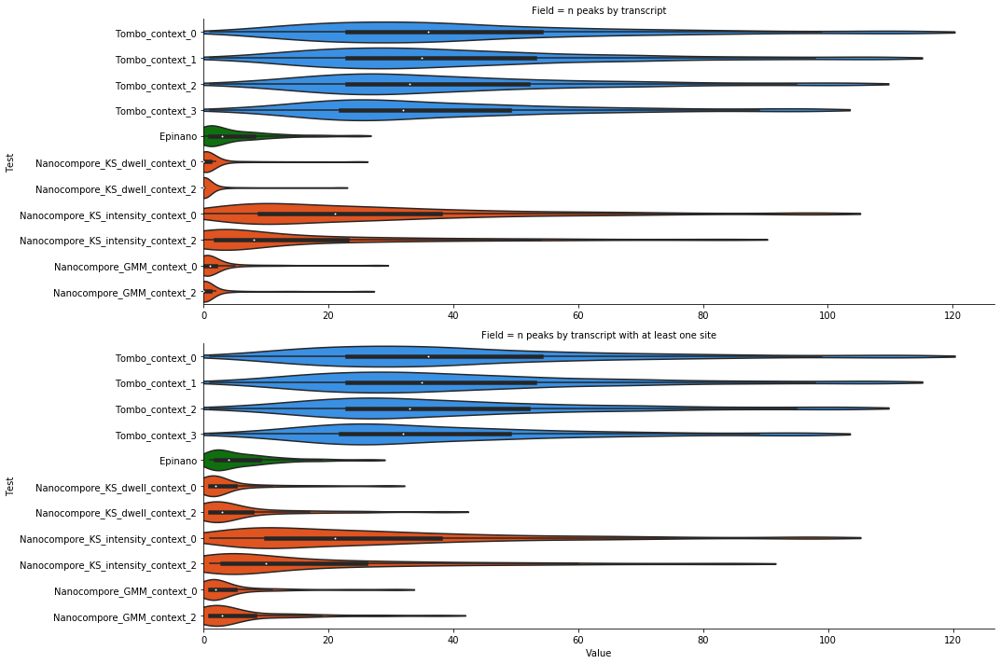

In [49]:
print("Load Dataframe")
tombo_fn = "text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz"
epinano_fn = "text_output_epinano/Epinano_mod_calls.tsv.gz"
nanocompore_fn = "text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz"
tombo_df = pd.read_csv(tombo_fn, sep="\t")
epinano_df = pd.read_csv(epinano_fn, sep="\t")
nanocompore_df = pd.read_csv(nanocompore_fn, sep="\t")

print("Load Transcript length")
tx_len_dict = OrderedDict()
with pyfaidx.Fasta("/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa") as fa:
    for i in fa:
        tx_len_dict[i.name]= len(i)

print ("Iterate over data fields")
tombo_fields = ["merged_context_0_peaks","merged_context_1_peaks","merged_context_2_peaks","merged_context_3_peaks"]
tombo_fields_rename = ["Tombo_context_0","Tombo_context_1","Tombo_context_2","Tombo_context_3"]
epinano_fields = ["mod_status"]
epinano_fields_rename = ["Epinano"]
nanocompore_fields = ["KS_dwell_peaks","KS_dwell_peaks_context_2","KS_intensity_peaks","KS_intensity_peaks_context_2","GMM_logit_peaks","GMM_logit_peaks_context_2"]
nanocompore_fields_rename = ["Nanocompore_KS_dwell_context_0","Nanocompore_KS_dwell_context_2","Nanocompore_KS_intensity_context_0","Nanocompore_KS_intensity_context_2","Nanocompore_GMM_context_0","Nanocompore_GMM_context_2"]

d = OrderedDict()
for label in ["n peaks by transcript", "n peaks by transcript with at least one site"]:
    d[label] = defaultdict(list)
    
for df, fields, fields_rename in ((tombo_df, tombo_fields, tombo_fields_rename), (epinano_df, epinano_fields, epinano_fields_rename), (nanocompore_df, nanocompore_fields, nanocompore_fields_rename)):
    # Get stats per transcripts
    for tx, tx_df in df.groupby("ref_id"):
        tx_len = tx_len_dict[tx]
        for field, field_rename in zip(fields, fields_rename):
            s = tx_df[field].dropna()
            if s.empty:
                continue
            else:
                n_peaks = len(s[s==True])

                # Fill in dict
                d["n peaks by transcript"][field_rename].append(n_peaks)
                
                if n_peaks:
                    d["n peaks by transcript with at least one site"][field_rename].append(n_peaks)

print ("Summarize Data")
record_l = []
summary_d = defaultdict(OrderedDict)
for field, field_d in d.items():
    for test, val_list in field_d.items():
#         summary_d[field][test] = OrderedDict()
        summary_d[field+"_median"][test] = np.median(val_list)
        summary_d[field+"_mean"][test] = np.mean(val_list)
        summary_d[field+"_max"][test] = np.max(val_list)
        
        upper = np.percentile(val_list, [98])
        for val in np.clip(val_list, 0, upper):
            record_l.append((field, test, val))
    
jprint (field, bold=True)
df = pd.DataFrame.from_dict(summary_d, orient="columns")
df = df.sort_index()
display(df)

colors = ["dodgerblue"]*4+["green"]+["orangered"]*6    
df = pd.DataFrame(record_l, columns=["Field", "Test", "Value"])
g = sns.catplot(y="Test", x="Value", col="Field", data=df, height=5, aspect=3, sharex=False, orient="h", kind="violin", col_wrap=1, palette=colors, cut=1, scale="width", inner="box")
for ax in g.axes:
    ax.set_xlim(0, None)
    
g.savefig("./intersection_results/transcript_level_stats.svg", type="svg")

### Peak calling overlap in shared transcripts

#### Upset all methods

Parsing data for program Tombo
	Processing field Tombo_context_0
	Processing field Tombo_context_1
	Processing field Tombo_context_2
	Processing field Tombo_context_3
Parsing data for program Epinano
	Processing field Epinano
Parsing data for program Nanocompore
	Processing field Nanocompore_GMM_context_0
	Processing field Nanocompore_KS_dwell_context_0
	Processing field Nanocompore_KS_intensity_context_0
	Processing field Nanocompore_GMM_context_2
	Processing field Nanocompore_KS_dwell_context_2
	Processing field Nanocompore_KS_intensity_context_2
Summarize methods per tx for upsetplot 
Getting tx found in all methods
	Transcripts shared in all 3 methods: 224
Merging and filtering data
	Overall number of positions: 201,581
Counting overlapping peaks


100%|██████████| 224/224 [01:27<00:00,  2.56it/s]


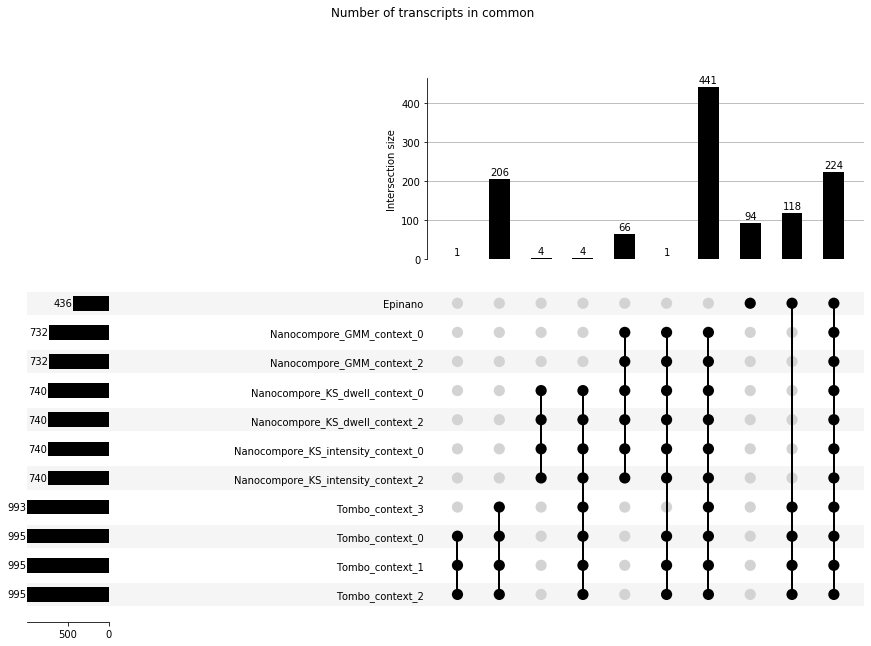

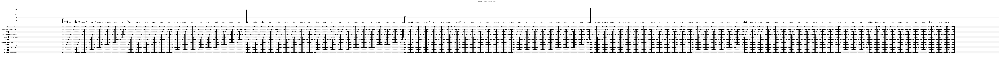

In [216]:
import upsetplot as usp 

min_len_tx = 100
extend = 4 

samples_d = OrderedDict()
samples_d["Tombo"] = {
    "fn":"text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz",
    "labels":["Tombo_context_0","Tombo_context_1","Tombo_context_2","Tombo_context_3"],
    "peak_fields":["merged_context_0_peaks","merged_context_1_peaks","merged_context_2_peaks","merged_context_3_peaks"],
    "pvalue_fields":["merged_context_0_pvalue","merged_context_1_pvalue","merged_context_2_pvalue","merged_context_3_pvalue"]}
samples_d["Epinano"] = {
    "fn":"text_output_epinano/Epinano_mod_calls.tsv.gz",
    "labels":["Epinano"],
    "peak_fields":["mod_status"],
    "pvalue_fields":["mod_ratio"]}
samples_d["Nanocompore"] = {
    "fn":"text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz",
    "labels":["Nanocompore_GMM_context_0","Nanocompore_KS_dwell_context_0","Nanocompore_KS_intensity_context_0","Nanocompore_GMM_context_2","Nanocompore_KS_dwell_context_2","Nanocompore_KS_intensity_context_2"],
    "peak_fields":["GMM_logit_peaks","KS_dwell_peaks","KS_intensity_peaks","GMM_logit_peaks_context_2","KS_dwell_peaks_context_2","KS_intensity_peaks_context_2"],
    "pvalue_fields":["GMM_logit_pvalue","KS_dwell_pvalue","KS_intensity_pvalue","GMM_logit_pvalue_context_2","KS_dwell_pvalue_context_2","KS_intensity_pvalue_context_2"]}


method_tx_dict = OrderedDict()
all_df_list = []

for prog, prog_d in samples_d.items():
    stdout_print (f"Parsing data for program {prog}\n")
    df = pd.read_csv(prog_d["fn"], sep="\t")
    for label, peak_field, pvalue_field in zip(prog_d["labels"], prog_d["peak_fields"], prog_d["pvalue_fields"]):
        
        stdout_print (f"\tProcessing field {label}\n")
        field_df = df[["ref_id", "pos", peak_field]].copy()
        field_df = field_df.rename(columns={peak_field:label})
        field_df = field_df.dropna()
        field_df = field_df.sort_values(by=["ref_id", "pos"])
        all_df_list.append(field_df)

       # find valid tx
        tx_counts = field_df["ref_id"].value_counts()
        tx_counts = tx_counts[tx_counts>=min_len_tx]
        method_tx_dict[label] = list(tx_counts.index)

stdout_print (f"Summarize methods per tx for upsetplot \n")
tx_method_dict = defaultdict(list)
# Get methods by transcripts
for label, tx_list in method_tx_dict.items():
    for tx in tx_list:
        tx_method_dict[tx].append(label)
        
# Invert dict directionality
methods_tx_num_counter = Counter()
for tx, methods_list in tx_method_dict.items():
    methods_key = tuple(sorted(methods_list))
    methods_tx_num_counter[methods_key]+=1
    
data = usp.from_memberships(list(methods_tx_num_counter.keys()), list(methods_tx_num_counter.values()))

fig = pl.figure()
axes = usp.plot(data, fig=fig, show_counts=True)
fig.set_figheight(10)
fig.set_figwidth(15)
axes["totals"].grid(False)
_ = fig.suptitle("Number of transcripts in common")

stdout_print (f"Getting tx found in all methods\n")
all_tx_set = set()
for label, tx_list in method_tx_dict.items():
    if not all_tx_set:
        all_tx_set = set(tx_list)
    else:
        all_tx_set = all_tx_set.intersection(set(tx_list))
stdout_print("\tTranscripts shared in all 3 methods: {:,}\n".format(len(all_tx_set)))

stdout_print (f"Merging and filtering data\n")
all_df = pd.DataFrame(columns=["ref_id","pos"])
for method_df in all_df_list:
    method_df = method_df[method_df["ref_id"].isin(all_tx_set)]
    all_df = pd.merge(all_df, method_df, how="outer", on=["ref_id","pos"])
stdout_print("\tOverall number of positions: {:,}\n".format(len(all_df)))

stdout_print (f"Counting overlapping peaks\n")
peak_cat_d = defaultdict(set)
methods = all_df.columns[2:]

all_df["any"] = all_df[methods].any(axis=1)

all_overlap_counts = Counter()
overlap_t = namedtuple("overlap", ["start","end","methods"])
for tx, tx_df in tqdm(all_df.groupby("ref_id")):
    tx_df = tx_df.drop(columns="ref_id")
    tx_df = tx_df.set_index("pos")
    tx_df = tx_df.sort_index()
    
    any_pos = tx_df[tx_df["any"]==True].index
    min_pos = tx_df.index.min()
    max_pos = tx_df.index.max()
    
    tx_overlap_set = set()
    
    for pos in any_pos:
        win_start = pos-extend
        if win_start < min_pos:
            win_start = min_pos
        win_end = pos+extend-1
        if win_end > max_pos:
            win_end = max_pos

        win_df = tx_df.loc[win_start:win_end]
        pos_list = sorted(win_df[win_df["any"]==True].index)
        any_method = win_df[methods].any(axis=0)
        method_tuple = tuple(sorted(any_method[any_method==True].index))
        tx_overlap_set.add(overlap_t(start=pos_list[0], end=pos_list[-1], methods=method_tuple))

    # Deduplicate overlap and smaller interval included in larger ones  
    cleaned_tx_overlap_set=set()
    keep_idx = []
    for s1 in tx_overlap_set:
        keep = True
        for s2 in tx_overlap_set:
            if s1 != s2:
                if s1.start >= s2.start and s1.end <= s2.end:
                    keep=False
        if keep:
            cleaned_tx_overlap_set.add(s1)
            
    for s in cleaned_tx_overlap_set:
        all_overlap_counts[s.methods]+=1
        
data = usp.from_memberships(list(all_overlap_counts.keys()), list(all_overlap_counts.values()))

fig = pl.figure()
axes = usp.plot(data, fig=fig, show_counts=True)
fig.set_figheight(10)
fig.set_figwidth(200)
axes["totals"].grid(False)
_ = fig.suptitle("Number of transcripts in common")

#### Intersection 3 methods

In [260]:
out_dir = "./intersection_results"
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_paper_analyses/tombo_epinano_comparison/intersection_results


In [261]:
import upsetplot as usp 

min_len_tx = 100
extend = 5

samples_d = OrderedDict()
samples_d["Tombo"] = {
    "fn":"text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz",
    "labels":["Tombo_context_2"],
    "peak_fields":["merged_context_2_peaks"],
    "pvalue_fields":["merged_context_2_pvalue"]}
samples_d["Epinano"] = {
    "fn":"text_output_epinano/Epinano_mod_calls.tsv.gz",
    "labels":["Epinano"],
    "peak_fields":["mod_status"],
    "pvalue_fields":["mod_ratio"]}
samples_d["Nanocompore"] = {
    "fn":"text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz",
    "labels":["Nanocompore_GMM_context_2"],
    "peak_fields":["GMM_logit_peaks_context_2"],
    "pvalue_fields":["GMM_logit_pvalue_context_2"]}

method_tx_dict = OrderedDict()
all_df_list = []

for prog, prog_d in samples_d.items():
    stdout_print (f"Parsing data for program {prog}\n")
    df = pd.read_csv(prog_d["fn"], sep="\t")
    for label, peak_field, pvalue_field in zip(prog_d["labels"], prog_d["peak_fields"], prog_d["pvalue_fields"]):
        
        stdout_print (f"\tProcessing field {label}\n")
        field_df = df[["ref_id", "pos", peak_field]].copy()
        field_df = field_df.rename(columns={peak_field:label})
        field_df = field_df.dropna()
        field_df = field_df.sort_values(by=["ref_id", "pos"])
        all_df_list.append(field_df)

       # find valid tx
        tx_counts = field_df["ref_id"].value_counts()
        tx_counts = tx_counts[tx_counts>=min_len_tx]
        method_tx_dict[label] = list(tx_counts.index)

stdout_print (f"Summarize methods per tx for upsetplot \n")
tx_method_dict = defaultdict(list)
# Get methods by transcripts
for label, tx_list in method_tx_dict.items():
    for tx in tx_list:
        tx_method_dict[tx].append(label)
        
# Invert dict directionality
methods_tx_num_counter = Counter()
for tx, methods_list in tx_method_dict.items():
    methods_key = tuple(sorted(methods_list))
    methods_tx_num_counter[methods_key]+=1
    
stdout_print (f"Getting tx found in all methods\n")
all_tx_set = set()
for label, tx_list in method_tx_dict.items():
    if not all_tx_set:
        all_tx_set = set(tx_list)
    else:
        all_tx_set = all_tx_set.intersection(set(tx_list))
stdout_print("\tTranscripts shared in all 3 methods: {:,}\n".format(len(all_tx_set)))

stdout_print (f"Merging and filtering data\n")
all_df = pd.DataFrame(columns=["ref_id","pos"])
for method_df in all_df_list:
    method_df = method_df[method_df["ref_id"].isin(all_tx_set)]
    all_df = pd.merge(all_df, method_df, how="outer", on=["ref_id","pos"])
stdout_print("\tOverall number of positions: {:,}\n".format(len(all_df)))

stdout_print (f"Counting overlapping peaks\n")
peak_cat_d = defaultdict(set)
methods = all_df.columns[2:]

all_df["any"] = all_df[methods].any(axis=1)

all_overlap_counts = Counter()
all_overlap_dict = defaultdict(list)
overlap_t = namedtuple("overlap", ["start","end","methods"])
for tx, tx_df in tqdm(all_df.groupby("ref_id")):
    tx_df = tx_df.drop(columns="ref_id")
    tx_df = tx_df.set_index("pos")
    tx_df = tx_df.sort_index()
    
    any_pos = tx_df[tx_df["any"]==True].index
    min_pos = tx_df.index.min()
    max_pos = tx_df.index.max()
    
    tx_overlap_set = set()
    
    for pos in any_pos:
        win_start = pos-extend
        if win_start < min_pos:
            win_start = min_pos
        win_end = pos+extend-1
        if win_end > max_pos:
            win_end = max_pos

        win_df = tx_df.loc[win_start:win_end]
        pos_list = sorted(win_df[win_df["any"]==True].index)
        any_method = win_df[methods].any(axis=0)
        method_tuple = tuple(sorted(any_method[any_method==True].index))
        tx_overlap_set.add(overlap_t(start=pos_list[0], end=pos_list[-1], methods=method_tuple))

    # Deduplicate overlap and smaller interval included in larger ones  
    cleaned_tx_overlap_set=set()
    keep_idx = []
    for s1 in tx_overlap_set:
        keep = True
        for s2 in tx_overlap_set:
            if s1 != s2:
                if s1.start >= s2.start and s1.end <= s2.end:
                    keep=False
        if keep:
            cleaned_tx_overlap_set.add(s1)
    
    coord_t = namedtuple("coord", ["tx","start","end"])
    for s in cleaned_tx_overlap_set:
        all_overlap_dict[s.methods].append(coord_t(tx, s.start, s.end))
        all_overlap_counts[s.methods]+=1

Parsing data for program Tombo
	Processing field Tombo_context_2
Parsing data for program Epinano
	Processing field Epinano
Parsing data for program Nanocompore
	Processing field Nanocompore_GMM_context_2
Summarize methods per tx for upsetplot 
Getting tx found in all methods
	Transcripts shared in all 3 methods: 224
Merging and filtering data
	Overall number of positions: 201,254
Counting overlapping peaks


100%|██████████| 224/224 [00:23<00:00,  9.51it/s]


##### Upset and venn plots

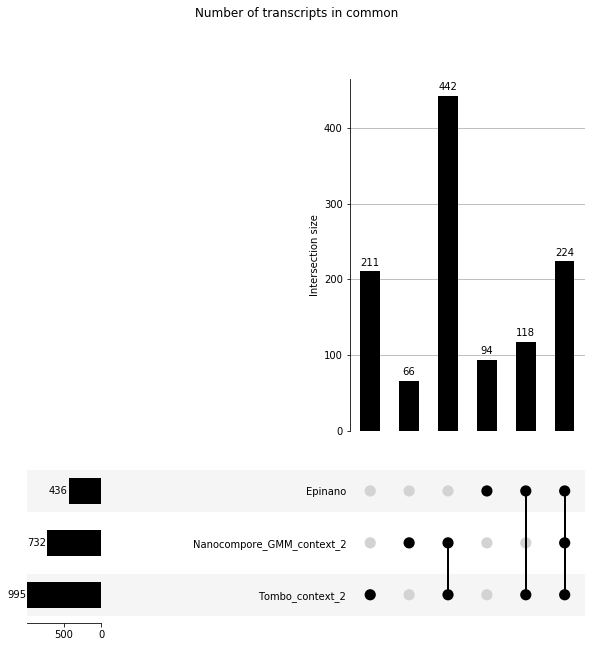

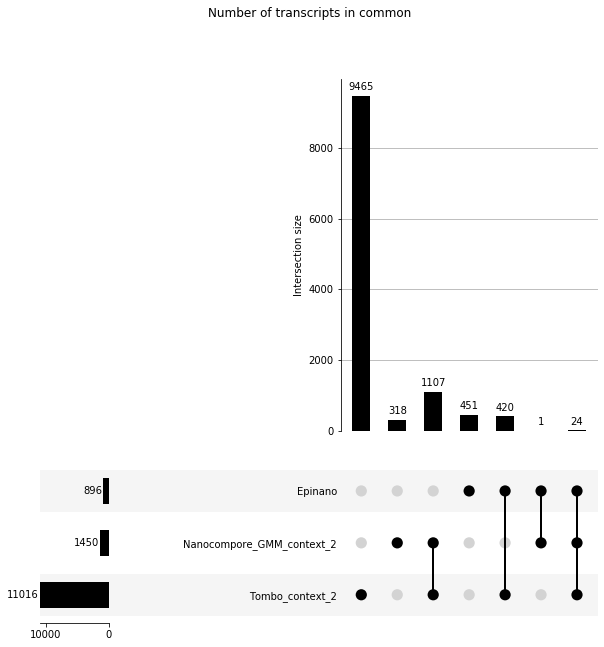

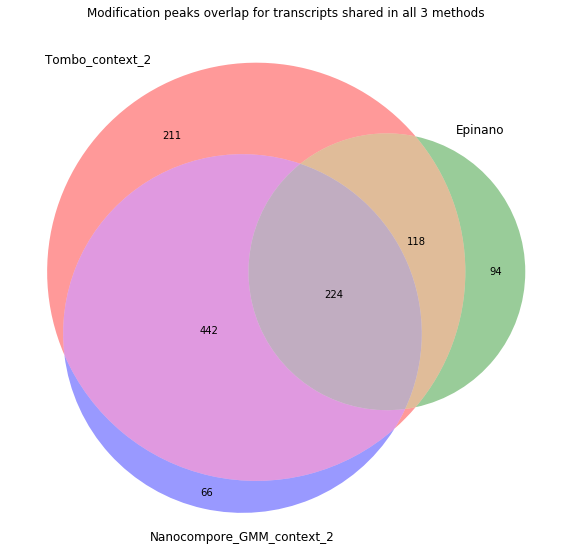

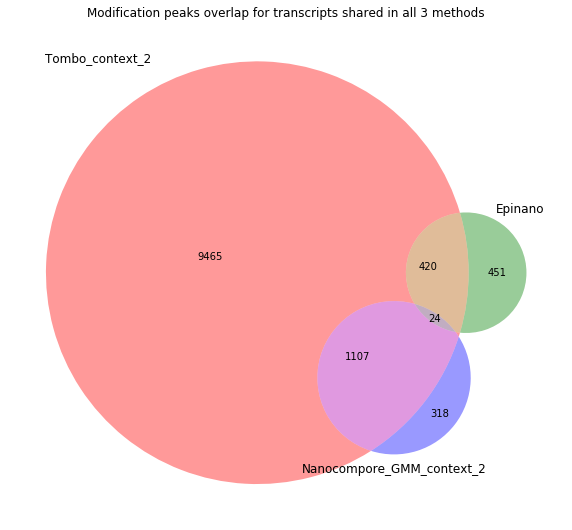

In [263]:

### Upset plot
data = usp.from_memberships(list(methods_tx_num_counter.keys()), list(methods_tx_num_counter.values()))
fig = pl.figure()
axes = usp.plot(data, fig=fig, show_counts=True)
fig.set_figheight(10)
fig.set_figwidth(10)
axes["totals"].grid(False)
_ = fig.suptitle("Number of transcripts in common")
fig.savefig("./intersection_results/upset_3_transcripts.svg", type="svg")

data = usp.from_memberships(list(all_overlap_counts.keys()), list(all_overlap_counts.values()))
fig = pl.figure()
axes = usp.plot(data, fig=fig, show_counts=True)
fig.set_figheight(10)
fig.set_figwidth(10)
axes["totals"].grid(False)
_ = fig.suptitle("Number of transcripts in common")
fig.savefig("./intersection_results/upset_3_peaks.svg", type="svg")

### VENN diagrams 
methods = ["Tombo_context_2", "Epinano", "Nanocompore_GMM_context_2"]

#Data wranging for Venn Diagramm
venn_res = OrderedDict()
for group, count in methods_tx_num_counter.items():
    code=["0","0","0"]
    for i, val in enumerate(methods):
        if val in group:
            code[i]="1"
    code = "".join(code)
    venn_res[code] = count
fig, ax = pl.subplots(figsize=(10, 10))
_ = mv.venn3(subsets=venn_res, set_labels=methods, ax=ax)
_ = ax.set_title("Modification peaks overlap for transcripts shared in all 3 methods")
fig.savefig("./intersection_results/venn_3_transcripts.svg", type="svg")

#Data wranging for Venn Diagramm
venn_res = OrderedDict()
for group, count in all_overlap_counts.items():
    code=["0","0","0"]
    for i, val in enumerate(methods):
        if val in group:
            code[i]="1"
    code = "".join(code)
    venn_res[code] = count
#venn_res['011']=20
    
fig, ax = pl.subplots(figsize=(10, 10))
_ = mv.venn3(subsets=venn_res, set_labels=methods, ax=ax)
_ = ax.set_title("Modification peaks overlap for transcripts shared in all 3 methods")
fig.savefig("./intersection_results/venn_3_peaks.svg", type="svg")

In [271]:
for m in  ["Epinano", "Nanocompore_GMM_context_2", "Tombo_context_2"]:
    total = 0
    for methods, count in all_overlap_counts.items():
        if m in methods:
            total+=count
            if len(methods) == 1:
                n = count
    uniqueness = round(n/total*100, 2)
    print(f"Unique sites for {m}: {uniqueness} %")

Unique sites for Epinano: 50.33 %
Unique sites for Nanocompore_GMM_context_2: 21.93 %
Unique sites for Tombo_context_2: 85.92 %


##### Export overlap to file

In [266]:
seq_extend = 5
fasta_ref = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"
out_dir = "intersection_results"

with pyfaidx.Fasta(fasta_ref) as fa:
    
    for methods_tuple, coord_list in all_overlap_dict.items():
        methods_str = "-".join(methods_tuple)

        print (f"Write results for {methods_str}")

        out_bed = f"./{out_dir}/{methods_str}.bed"
        out_tsv = f"./{out_dir}/{methods_str}.tsv"
        out_fasta = f"./{out_dir}/{methods_str}.fa"

        with open (out_bed, "w") as out_bed_fp, open (out_tsv, "w") as out_tsv_fp, open (out_fasta, "w") as out_fasta_fp:
            out_tsv_fp.write("transcript_id\tstart\tend\tseq\n")
            
            for tx, start, end in coord_list:
                
                # Extract sequence
                tx_seq = fa[tx]
                ext_start = start-extend
                ext_end = end+1+extend
                missing_start = missing_end = 0
                if ext_start < 0:
                    ext_start = 0
                    missing_start = extend-start
                if ext_end > len(tx_seq):
                    ext_end=len(tx_seq)
                    missing_end = end+extend-len(tx_seq)
                seq = missing_start*"N"+str(tx_seq[ext_start:ext_end])+missing_end*"N"
                
                out_bed_fp.write(f"{tx}\t{start}\t{end}\n")
                out_tsv_fp.write(f"{tx}\t{start}\t{end}\t{seq}\n")
                out_fasta_fp.write(f">{tx}:{start}-{end}\n{seq}\n")
                


Write results for Tombo_context_2
Write results for Nanocompore_GMM_context_2
Write results for Epinano
Write results for Nanocompore_GMM_context_2-Tombo_context_2
Write results for Epinano-Tombo_context_2
Write results for Epinano-Nanocompore_GMM_context_2-Tombo_context_2
Write results for Epinano-Nanocompore_GMM_context_2


### Save all peaks found per methods 

In [1]:
def get_seq_slice (seq, start, end, extend):
    ext_start = start-extend
    ext_end = end+1+extend
    missing_start = 0
    missing_end = 0
    if ext_start < 0:
        ext_start = 0
        missing_start = extend-start
    if ext_end > len(seq):
        ext_end=len(seq)
        missing_end = end+extend-len(seq)
    seq_slice = missing_start*"N"+str(seq[ext_start:ext_end])+missing_end*"N"
    
    return seq_slice

In [6]:
out_dir = "all_sites_results"
rmtree(out_dir, ignore_errors=True)
mkdir (out_dir)

extend = 10
fasta_ref = "/hps/nobackup/enright/tom/new_nanocompore/MOLM_METTL3_KD/nanocompore_pipeline/results/references/reference_transcriptome.fa"

print("Load Dataframes")
tombo_fn = "text_output_tombo/tombo_pvalues_combined_peaks.tsv.gz"
epinano_fn = "text_output_epinano/Epinano_mod_calls.tsv.gz"
nanocompore_fn = "text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz"
tombo_df = pd.read_csv(tombo_fn, sep="\t")
epinano_df = pd.read_csv(epinano_fn, sep="\t")
nanocompore_df = pd.read_csv(nanocompore_fn, sep="\t")

tombo_fields = [
    ["Tombo_context_0", "merged_context_0_pvalue", "merged_context_0_peaks"],
    ["Tombo_context_1", "merged_context_1_pvalue", "merged_context_1_peaks"],
    ["Tombo_context_2", "merged_context_2_pvalue", "merged_context_2_peaks"],
    ["Tombo_context_3", "merged_context_3_pvalue", "merged_context_3_peaks"]]

epinano_fields = [
    ["Epinano", "mod_ratio", "mod_status"]]

nanocompore_fields = [
    ["Nanocompore_GMM_context_0", "GMM_logit_pvalue", "GMM_logit_peaks"],
    ["Nanocompore_KS_dwell_context_0", "KS_dwell_pvalue", "KS_dwell_peaks"],
    ["Nanocompore_KS_intensity_context_0", "KS_intensity_pvalue", "KS_intensity_peaks"],
    ["Nanocompore_GMM_context_2", "GMM_logit_pvalue_context_2", "GMM_logit_peaks_context_2"],
    ["Nanocompore_KS_dwell_context_2", "KS_dwell_pvalue_context_2", "KS_dwell_peaks_context_2"],
    ["Nanocompore_KS_intensity_context_2", "KS_intensity_pvalue_context_2", "KS_intensity_peaks_context_2"]]

with pyfaidx.Fasta(fasta_ref) as fa:
    for df, fields in ((tombo_df, tombo_fields), (epinano_df, epinano_fields), (nanocompore_df, nanocompore_fields)):
        for label, score, status in fields:      
            print (f"\tWrite out all peaks for {label}")
            field_df = df[["ref_id", "pos", score, status]]
            field_df = field_df[field_df[status]==True]
            field_df = field_df.sort_values(by=["ref_id", "pos"])

            out_bed = f"./{out_dir}/{label}.bed"
            out_tsv = f"./{out_dir}/{label}.tsv"
            out_fasta = f"./{out_dir}/{label}.fa"

            with open (out_bed, "w") as out_bed_fp, open (out_tsv, "w") as out_tsv_fp, open (out_fasta, "w") as out_fasta_fp:
                out_tsv_fp.write(f"transcript_id\tstart\tend\tseq\tscore\n")
                for idx, line in field_df.iterrows():
                    tx = line["ref_id"]
                    start = end = int(line["pos"])
                    seq = get_seq_slice (seq=fa[tx], start=start, end=end, extend=extend).replace("T", "U")
                    score_val = line[score]

                    out_bed_fp.write(f"{tx}\t{start}\t{end}\n")
                    out_tsv_fp.write(f"{tx}\t{start}\t{end}\t{seq}\t{score_val}\n")
                    out_fasta_fp.write(f">{tx}:{start}-{end}_{score_val}\n{seq}\n")

            print(f"\t\tLine count:{fastcount(out_bed)}")

Creating /hps/nobackup/enright/nanopore/analyses/nanocompore_comparison/all_sites_results
Load Dataframes
	Write out all peaks for Tombo_context_0
		Line count:42081
	Write out all peaks for Tombo_context_1
		Line count:41302
	Write out all peaks for Tombo_context_2
		Line count:39873
	Write out all peaks for Tombo_context_3
		Line count:38192
	Write out all peaks for Epinano
		Line count:2391
	Write out all peaks for Nanocompore_GMM_context_0
		Line count:2376
	Write out all peaks for Nanocompore_KS_dwell_context_0
		Line count:1774
	Write out all peaks for Nanocompore_KS_intensity_context_0
		Line count:20733
	Write out all peaks for Nanocompore_GMM_context_2
		Line count:1570
	Write out all peaks for Nanocompore_KS_dwell_context_2
		Line count:1221
	Write out all peaks for Nanocompore_KS_intensity_context_2
		Line count:12596


In [7]:
head("./all_sites_results/Nanocompore_GMM_context_0.bed")
head("./all_sites_results/Nanocompore_GMM_context_0.tsv")
head("./all_sites_results/Nanocompore_GMM_context_0.fa")

ENST00000009589 46  46  
ENST00000009589 112 112 
ENST00000009589 128 128 
ENST00000009589 164 164 
ENST00000009589 207 207 
ENST00000009589 226 226 
ENST00000009589 238 238 
ENST00000009589 281 281 
ENST00000009589 296 296 
ENST00000009589 330 330 

transcript_id   start end seq                   score                  
ENST00000009589 46    46  UUUUGGUCCGCACGCUCCUGC 2.1378319461536782e-08 
ENST00000009589 112   112 GGAAGCCCGCGCGCAACAGCC 3.3056036060160786e-08 
ENST00000009589 128   128 CAGCCAUGGCUUUUAAGGAUA 1.3368858837391337e-08 
ENST00000009589 164   164 UGGAGCCGGAGGUGGCAAUUC 2.652953862998441e-07  
ENST00000009589 207   207 AAGCCGCAACGUAAAAUCCUU 1.1744337630729125e-07 
ENST00000009589 226   226 UUGGAAAAGGUGUGUGCUGAC 1.145631099451916e-14  
ENST00000009589 238   238 UGUGCUGACUUGAUAAGAGGC 1.6837995228887881e-06 
ENST00000009589 281   281 UGAAAGGACCAGUUCGAAUGC 2.7736010878299307e-08 
ENST00000009589 296   296 GAAUGCCUACCAAGACUUUGA 3.687549402395527e-05  

>ENST00000009589:46-46_2.137

## Get beta-actin stats for paper

In [50]:
df = pd.read_csv("./text_output_nanocompore/nanocompore_pvalues_combined.tsv.gz", sep="\t")
df = df[["ref_id", "pos", "GMM_logit_pvalue_context_2", "GMM_logit_peaks_context_2"]]
df = df[df["ref_id"]=="ENST00000646664"]
print("Number of peaks", len(df[df["GMM_logit_peaks_context_2"]==True]))
print("Number of significant kmers", len(df[df["GMM_logit_pvalue_context_2"]<=0.01]))

display(df)

Number of peaks 40
Number of significant kmers 337


,ref_id,pos,GMM_logit_pvalue_context_2,GMM_logit_peaks_context_2
689662,ENST00000646664,13,0.899536,False
689663,ENST00000646664,14,0.843689,False
689664,ENST00000646664,15,0.827145,False
689665,ENST00000646664,16,0.875914,False
689666,ENST00000646664,17,0.867206,False
689667,ENST00000646664,18,0.864024,False
689668,ENST00000646664,19,0.795628,False
689669,ENST00000646664,20,0.502140,False
689670,ENST00000646664,21,0.403338,False
689671,ENST00000646664,22,0.531404,False
